In [2]:
# Only run if you need specific libraries when using jupyter
# !pip install pandas
# !pip install numpy
# !pip install spacy
# !pip install demoji
# !pip install fasttext
# !pip install requests
# !pip install tqdm
# !pip install sklearn
# !pip install "gensim>=4.0.0"

  Using cached demoji-1.1.0-py3-none-any.whl (42 kB)


In [3]:
# Imports

# Data access, editing and management
import pandas as pd
import numpy as np
import sqlite3
# POS extraction and tokenization
import spacy
import regex as re
import demoji
# Language identification for tokens
import fasttext
import requests
# Processing time visualization
from tqdm import tqdm
tqdm.pandas()
# To run console commands for installation
import os
# For vectorization and clustering
from sklearn.feature_extraction.text import TfidfVectorizer
from spacy.lang.en.stop_words import STOP_WORDS as stop_words
from gensim.models import Word2Vec
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.cluster import KMeans

# Extract DF from part 1

In [6]:
# Extracting articles df
df = pd.read_pickle('articles.pkl')
# df

# Filter DF to only show as much relevant data as possible, eliminating files with errors, empty strings, and no content

In [7]:
# Filter out bad request or any empty body data on the df

# Remove articles that do not have any text - run only once to not cause error
df = df.loc[df['body_text'] != '']
df.loc[df['body_text'] == '']

,title,author,publication,body_text,url,state,nouns,adjetives,verbs,nav,lemmas,num_tokens


In [8]:
# Get rid of any nan values in body and title
a = df.loc[~df['title'].isnull()]
df = a
b = a.loc[~a['body_text'].isnull()]
df = b

In [9]:
df.loc[df['body_text'].isnull()]

,title,author,publication,body_text,url,state,nouns,adjetives,verbs,nav,lemmas,num_tokens


In [10]:
# Remove any 403 error files
a = df.loc[(~df['title'].str.contains('403')) & (~df['url'].isnull())]
b = a.loc[(~a['title'].str.contains('Forbidden')) & (~a['url'].isnull())]
df = b
b.loc[df['title'].str.contains('Forbidden')]

,title,author,publication,body_text,url,state,nouns,adjetives,verbs,nav,lemmas,num_tokens


In [11]:
# Reset index after performing first cleanup
df = df.reset_index(drop=True)

# Clean up text data to ensure POS tokens significance can be extracted properly by spacy

In [12]:
# Get emoji codes from library demoji
demoji.download_codes()

/var/folders/gv/857l914131304z8vlfgswdg80000gn/T/ipykernel_7742/932325091.py:2: FutureWarning: The demoji.download_codes attribute is deprecated and will be removed from demoji in a future version. It is an unused attribute as emoji codes are now distributed directly with the demoji package.
  demoji.download_codes()


In [13]:
'''
Function to remove any emojis in text
'''
def remove_emojis(text):
    dem = demoji.findall(text)
    for item in dem.keys():
        text = re.sub(item, '', text)
    return text

In [14]:
# Function to clean unprocessed text body from each article
def clean_text(text):
    # Remove emojis
    text = remove_emojis(text)
    # Remove any solo numbers in line
    text = re.sub(r'^[0-9]+\s.*', '', text, flags=re.MULTILINE)
    # Replace multiple spaces with one
    text = re.sub(' +', ' ', text)
    # Replace multiple newlines by splitting string into substrings saved in a list
    text = re.split('\s*\n\s*\n', text)
    text = [item for item in text if len(re.split(' ', item)) > 5]
    # Join all vals in list as a one string again
    text = " ".join(text)
    # Replace newline characters left with single space
    text = re.sub('\n', ' ', text)
    # Return cleaned text string
    return text

In [15]:
# Clean text within column 'body_text' in dataframe df
df['body_text'] = [clean_text(text) for text in df['body_text']]

In [16]:
df.head(3)

,title,author,publication,body_text,url,state,nouns,adjetives,verbs,nav,lemmas,num_tokens
0,Tornadoes severe weather updates: 26 dead in M...,None,None,Start the day smarter How often do women givin...,https://www.usatoday.com/story/news/nation/202...,Mississippi,day|woman|birth|hospital|heart|attack|seizure|...,smart|individual|other|deadly|notable|severe|d...,start|do|give|experience|podcast|sell|topic'wi...,start|day|smart|do|woman|give|birth|individual...,start|the|day|smart|how|often|do|woman|give|bi...,2488.0
1,Fatality confirmed in Vermont flooding amid ex...,ABC News,None,ABC NewsVideoLiveShowsElectionsInterest Succe...,https://abcnews.go.com/US/tornadoes-midwest-fl...,Illinois,ABC|NewsVideoLiveShowsElectionsInterest|Succes...,aboutturn|extreme|nationwideExtreme|most|multi...,notify|break|confirm|flood|continue|affect|pas...,ABC|NewsVideoLiveShowsElectionsInterest|Succes...,|ABC|NewsVideoLiveShowsElectionsInterest|Succ...,998.0
2,Terrifying moment monster tornado rips apart A...,Aneeta Bhole,None,US women spark fury with ANOTHER listless rend...,https://www.dailymail.co.uk/news/article-11926...,Arkansas,US|woman|fury|rendition|Star|Spangled|Banner|W...,listless|other|new|devastated|second|irreconci...,spark|sing|wrap|file|feel|abandon|file|cite|be...,US|woman|spark|fury|listless|rendition|Star|Sp...,US|woman|spark|fury|with|another|listless|rend...,13383.0


## Store df as pickle - intermediary step

In [17]:
df.to_pickle('articles_cleaned.pkl')

sql = sqlite3.connect('articles_cleaned.db')
df.to_sql('articles_cleaned', sql, if_exists='replace')
sql.close()

# Tokenization and POS tagging via Spacy

## Language detection function to ensure all tokens will be properly tagged based on the english language via fasttext

In [18]:
# Download from web the model for language detection from fasttext
model_filename = "lid.176.ftz"
r = requests.get(f"https://dl.fbaipublicfiles.com/fasttext/supervised-models/{model_filename}")
open(model_filename, 'wb').write(r.content)
# load language identification model 
lang_model = fasttext.load_model(model_filename)

In [19]:
'''
Function that detects if a text contains a great quantity of tokens in another language,
if it does, it is removed from our sample, but if it is below the threshold, we do not remove
the words due to the fact that natural disasters often use name of locations in the U.S. that
are rooted in words from other languages.

'''
def detect_language(doc):
    # Temporarily remove newline symbols due to function format requirements
    text = doc.replace("\n", " ")
    # Set desired language
    correct = "en"
    doc_l = lang_model.predict(text, k=2)
    # If first label is english and english label is highest value of two found languages
    if (doc_l[0][0].replace("__label__", "") == "en" and doc_l[1][0] > 2*doc_l[1][1]) or (doc_l[0][1].replace("__label__", "") == "en" and doc_l[1][1] > doc_l[1][0]):
        # Confirm to use text
        return True

        # In case we wish to proceed to evaluate tokens and extract unnecessary non-english words
        # # Create flag
        # ok = not_ok = 0
        # # Perform individual token checks via fasttext
        # for token in tokens:
        #     l = lang_model.predict(token, k=2)
        #     # If percentage in english is greater than twice the percentage of other language
        #     if l[1][0] > 2*l[1][1]):
        #         # Simplify label to language abbreviation
        #         predict = l[0][0].replace("__label__", "")
        #         # If extracted language result is English
        #         if predict == correct:
        #             ok += 1
        #         else:
        #             print(f"Error at '{text}'")
        #             print(f"should be {correct}, predicted {predict} ")
        #             not_ok += 1

        #     print(f"ok = {ok}, not ok = {not_ok}")
    else:
        # Indicate document is in another language mostly and won't be adecuate to be used for k-means
        return False

## Part of Speech(POS) tagging function to Find and store into DF POS via spacy

In [20]:
# Install spacy module by running through os library in terminal/console
!python3 -m spacy download en_core_web_lg

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 587.7/587.7 MB 5.7 MB/s eta 0:00:0000:0100:01
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_lg')


In [21]:
# Create Spacy tokenizer based on downloaded language model in english
nlp = spacy.load("en_core_web_lg")

# Function to assign POS types into df
def word_types(doc):
    nouns = []
    adjectives = []
    verbs = []
    lemmas = []
    nav = []
    for token in doc:
        lemmas.append(token.lemma_)
        # adjectives (and adverbs)
        if token.pos_ == "ADJ": #or token.pos_ == "ADV":
            adjectives.append(token.lemma_)
            nav.append(token.lemma_)
        # nouns
        if token.pos_ == "NOUN" or token.pos_ == "PROPN":
            nouns.append(token.lemma_)
            nav.append(token.lemma_)
        # verbs
        if token.pos_ == "VERB" or token.pos_ == "AUX":
            verbs.append(token.lemma_)
            nav.append(token.lemma_)
            
    return (nouns, adjectives, verbs, nav, lemmas)

## Main tokenization and tagging function

In [22]:
# Navigate through each row to set POS tags in corresponding locations
def pos_tagging(a:pd.DataFrame):
    # Iterate through rows to get text of each row
    for index, row in a.iterrows():
        # Check if language is considered English
        l = detect_language(row['body_text'])
        # If returns True because it is in English, perform tokenization
        if l: 
            # Use Spacy library to create tokens with text of document selected
            tokens = nlp(row['body_text'])
            # If produced tokens amount to greater than 30
            if len(tokens) >= 30:
                (nouns, adjectives, verbs, nav, lemmas) = word_types(tokens)
                a.at[index, 'nouns'] = "|".join(nouns)
                a.at[index, 'adjetives'] = "|".join(adjectives)
                a.at[index, 'verbs'] = "|".join(verbs)
                a.at[index, 'nav'] = "|".join(nav) # combinations
                a.at[index, 'lemmas'] = "|".join(lemmas)
                a.at[index, 'num_tokens'] = len(tokens)

In [23]:
# Temporary small df for testing
# a = df.copy(deep=True)
# a = a[:10]
# pos_tagging(a)
# a

In [24]:
# Function call for pos tagging extraction - averages 18 minutes of run
pos_tagging(df)

KeyboardInterrupt: 

In [ ]:
df.head(2)

,title,author,publication,body_text,url,state,nouns,adjetives,verbs,nav,lemmas,num_tokens
0,Tornadoes severe weather updates: 26 dead in M...,None,None,Start the day smarter How often do women givin...,https://www.usatoday.com/story/news/nation/202...,Mississippi,day|woman|birth|hospital|heart|attack|seizure|...,smart|individual|other|deadly|notable|severe|d...,start|do|give|experience|podcast|sell|topic'wi...,start|day|smart|do|woman|give|birth|individual...,start|the|day|smart|how|often|do|woman|give|bi...,2488.0
1,Fatality confirmed in Vermont flooding amid ex...,ABC News,None,ABC NewsVideoLiveShowsElectionsInterest Succe...,https://abcnews.go.com/US/tornadoes-midwest-fl...,Illinois,ABC|NewsVideoLiveShowsElectionsInterest|Succes...,aboutturn|extreme|nationwideExtreme|most|multi...,notify|break|confirm|flood|continue|affect|pas...,ABC|NewsVideoLiveShowsElectionsInterest|Succes...,|ABC|NewsVideoLiveShowsElectionsInterest|Succ...,998.0


## If in need to start off from beginning but not perform clean

In [ ]:
# df = pd.read_pickle('articles_cleaned.pkl')

## Cleanup extended df from rows with no tags data and formatting issues

In [ ]:
# Remove from df rows with empty cells in the POS tag columns
a = df.loc[~df['nouns'].isnull()]
df = a
# Reset index
df = df.reset_index(drop=True)

In [ ]:
# Check if any null values still contained
df.loc[df['nouns'].isnull()]

,title,author,publication,body_text,url,state,nouns,adjetives,verbs,nav,lemmas,num_tokens


In [ ]:
# Output df
df.sample(3)

,title,author,publication,body_text,url,state,nouns,adjetives,verbs,nav,lemmas,num_tokens
2182,"Texas ice storm updates: Over 350,000 customer...",ABC News,None,ABC NewsVideoLiveShowsElectionsInterest Succe...,https://abcnews.go.com/US/live-updates/texas-i...,Texas,ABC|NewsVideoLiveShowsElectionsInterest|Succes...,aboutturn|cold|more|massive|southern|cold|just...,notify|break|update|be|update|etlinkshare|to|f...,ABC|NewsVideoLiveShowsElectionsInterest|Succes...,|ABC|NewsVideoLiveShowsElectionsInterest|Succ...,717.0
3262,\n\tSouth Dakota National Guard continues supp...,None,None,An official website of the United States gove...,https%3A%2F%2Fwww.nationalguard.mil%2FNews%2FA...,South Dakota,website|United|States|government|website|.mil|...,official|official|official|sensitive|official|...,be|know|use|belong|use|mean|’ve|connect|skip|a...,official|website|United|States|government|be|k...,|an|official|website|of|the|United|States|gov...,890.0
1879,"Fierce winds, tornado threat looming for Wisco...",Bob Henson,None,Stay in the know about climate impacts and sol...,http://yaleclimateconnections.org/2021/07/fier...,Wisconsin,know|climate|impact|solution|newsletter|Weekly...,weekly|destructive|late|new|new|high|intense|m...,stay|subscribe|stay|subscribe|click|agree|shar...,stay|know|climate|impact|solution|subscribe|ne...,stay|in|the|know|about|climate|impact|and|solu...,1701.0


# Store and extract data as DB and Pickle files

In [ ]:
# Store df also in a local sqlite3 database for easy management and create new pickle file with edited format
df.to_pickle('articles_extended.pkl')

# Transform list on tokens column into text due to sqlite3 requirements in data types
sql = sqlite3.connect('articles_extended.db')
df.to_sql('articles_extended', sql, if_exists='replace')
sql.close()

In [25]:
df = pd.read_pickle('articles_extended.pkl')

# Create document-term matrix using the TfidfVectorizer applied to the dataframe's column nouns

In [26]:
# Create a tf-idf vectorizer containing stopwords
tfidf_vectorizer = TfidfVectorizer(stop_words=list(stop_words), min_df=10, sublinear_tf=True, use_idf=True)
# Use fit transform on vectorizer with nouns data - standard deviation, then mean of data to scale values
tfidf_vectors = tfidf_vectorizer.fit_transform(df["nouns"])
# Create df from tfidf results and values
tfidf_df = pd.DataFrame(tfidf_vectors)

/Users/ryangarland/opt/anaconda3/lib/python3.9/site-packages/sklearn/feature_extraction/text.py:396: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ll', 've'] not in stop_words.
  warnings.warn(


In [27]:
tfidf_df

,0
0,"(0, 5861)\t0.027134004404549616\n (0, 6752)..."
1,"(0, 8501)\t0.02930637980512278\n (0, 10650)..."
2,"(0, 2346)\t0.009349884057244705\n (0, 6961)..."
3,"(0, 7752)\t0.06488928059327886\n (0, 3783)\..."
4,"(0, 7678)\t0.06674913323624099\n (0, 4275)\..."
...,...
3691,"(0, 6831)\t0.08196341432564008\n (0, 2654)\..."
3692,"(0, 565)\t0.14638919552160054\n (0, 7652)\t..."
3693,"(0, 4789)\t0.1438990788235409\n (0, 776)\t0..."
3694,"(0, 1763)\t0.07624550775721466\n (0, 10335)..."


# Extract nouns as word tokens from df['nouns'] column

In [28]:
# For word split by given specific regex, which has been set to all lowercase, and is not found in stop_words
# And is found in the text within each row of a df column called 'nouns'
gensim_words = [[w for w in re.split(r'[\\|\\#]', doc.lower()) if w not in stop_words]
                    for doc in df["nouns"]]
# Output list of nouns per row that has excluded stopwords
gensim_words

[['day',
  'woman',
  'birth',
  'hospital',
  'heart',
  'attack',
  'seizure',
  'kidney',
  'failure',
  'blood',
  'transfusion',
  'problem',
  'death',
  'human',
  'trafficking',
  'sports',
  'entertainment',
  'life',
  'money',
  'tech',
  'travel',
  'opinion',
  'obituariesonly',
  'usa',
  'today',
  'newsletters',
  'subscribers',
  'archives',
  'crossword',
  'enewspaper',
  'magazines',
  'investigations',
  'weather',
  'forecast',
  'video',
  'humankind',
  'curiousbest',
  'booklist',
  'pets',
  'food',
  'reviewed',
  'coupons',
  'blueprint',
  'best',
  'auto',
  'insurance',
  'best',
  'pet',
  'insurance',
  'best',
  'travel',
  'insurance',
  'best',
  'credit',
  'cards',
  'best',
  'cd',
  'rate',
  'best',
  'personal',
  'loans',
  'map',
  'south',
  'weather',
  'tornado',
  'updatessusan',
  'miller',
  'john',
  'bacon',
  'jorge',
  'l.',
  'ortiz',
  'ross',
  'todayrolling',
  'fork',
  'miss.',
  'severe',
  'storm',
  'south',
  'sunday',
  '

# Train Word2Vec model using df['nouns'] data to obtain word embeddings

In [29]:
'''
Use gemsin W2V model that implements skip-grams and continuous-bag-of-words
to capture conceptual similarities and train it using the word tokens from 
df to consider words that appear at least 5 times
'''
w2v = Word2Vec(gensim_words, min_count=5)
w2v.wv.save_word2vec_format("articles_extended.w2v")
# Get the keyedModel vectors
word_vectors = w2v.wv
# Example of content, aka number of keys or features, and their corresponding index
print(len(word_vectors.key_to_index.keys())) # word keys and length
word_vectors.key_to_index

22948


{'storm': 0,
 'weather': 1,
 'news': 2,
 'tornado': 3,
 'state': 4,
 'county': 5,
 'wind': 6,
 'area': 7,
 'snow': 8,
 'damage': 9,
 'people': 10,
 'power': 11,
 'day': 12,
 'new': 13,
 'national': 14,
 'service': 15,
 'home': 16,
 'hurricane': 17,
 'republic': 18,
 'rain': 19,
 'city': 20,
 'year': 21,
 'water': 22,
 'time': 23,
 'winter': 24,
 'hour': 25,
 'wednesday': 26,
 'emergency': 27,
 'inch': 28,
 'road': 29,
 'flooding': 30,
 'tree': 31,
 'video': 32,
 'thursday': 33,
 'morning': 34,
 'temperature': 35,
 'friday': 36,
 'south': 37,
 'north': 38,
 'condition': 39,
 'heat': 40,
 'warning': 41,
 'week': 42,
 'system': 43,
 'mph': 44,
 'community': 45,
 'tuesday': 46,
 'thunderstorm': 47,
 'report': 48,
 'night': 49,
 'school': 50,
 'pm': 51,
 '': 52,
 'center': 53,
 'forecast': 54,
 'official': 55,
 'monday': 56,
 'flood': 57,
 'resident': 58,
 'p.m.': 59,
 'outage': 60,
 'information': 61,
 'event': 62,
 'july': 63,
 'line': 64,
 'sunday': 65,
 'region': 66,
 'privacy': 67,
 'c

# Represent each document via a one real-valued embedding vector/document embedding using the previously produced TF-IDF weights AND w2v embeddings

In [30]:
''' 
Use semantic transformation to create the real-value embedding
of a document by averaging all the embedding values of features
found in said document
'''

# List containing averaged word vectors from tf/idf, aka doc vectors
doc_v = []

# Get features from the tfidf vectorizer
fn = tfidf_vectorizer.get_feature_names_out()

# Iterate over all TF/IDF vectors, aka all documents/rows
for i in tqdm(range(tfidf_vectors.shape[0])): # adding tqdm to account for time it takes to process
    # Create array with size 100 (vector dimensions)from 
    # w2v to start averaged word vector of a current document to 0
    v = np.zeros(word_vectors.vector_size)

    ''' 
    Get the row and column index vals for tfidf vectors with nonzeros
    as this represents the words that actually occur in the i-th document
    ''' 
    rows, cols = tfidf_vectors[i].nonzero()

    # For index number in columns array
    for c in cols:
        
        # Extract feature from tfidf list of features
        feature = fn[c]
        '''
        If feature word found in this document is also in the word embeddings of w2v,
        multiply its tfidf value against vectors from embedding
        Example, decimal like 0.03849398273 * array['100 vectors values here']
        Then add it to v array of started as zeros of same length
        So basically, mutiply both vectors for same word from different methods,
        Then total sum all these vectors for all the words existing into a single vector
        to represent document
        '''
        if feature in word_vectors.key_to_index:
            wv = word_vectors[feature] # Extract embedding of w2v of given word
            v += tfidf_vectors[i][0,c] * (wv)
            
    ''' 
    Once you add all vectors from w2v * value of given features,
    normalize it if needed when the total values greater than 0
    '''
    if np.linalg.norm(v) > 0:
        v = v/np.linalg.norm(v)
    # Add normalized averaged vector value into the list
    doc_v.append(v)

100%|██████████| 3696/3696 [00:49<00:00, 74.39it/s]


## Test embeddings provided by Word2Vec

In [31]:
# Test document embeddings given a keyword related to disaster topic
token = 'tornado'
# Get embedding/vector for said token from word vectors produced by word2Vec
token_v = word_vectors[token]
token_v # Array of 100 vals considered the dimensions of the word

array([-3.8240647 ,  1.8838736 ,  2.532373  ,  1.1025912 ,  0.80812997,
       -3.5615249 ,  0.2530182 ,  0.46123832,  3.2218523 , -1.8329098 ,
        0.86583495,  0.53215355, -2.644227  , -0.23235951,  0.55306697,
       -0.7478412 ,  1.5625033 , -1.4925323 , -3.7873244 ,  0.11282054,
       -0.9278461 ,  0.0751727 , -1.3250104 , -0.2771026 , -0.90955824,
       -2.1097815 ,  1.9662845 , -0.5805556 ,  0.01940206, -0.50468725,
       -1.4014943 , -1.9106022 , -0.41250762,  2.1836104 , -1.4630883 ,
        1.2092699 ,  0.16504976, -3.6078856 , -3.4366508 ,  1.4569477 ,
        2.6941338 ,  1.1297988 ,  0.31899503, -0.9199141 ,  2.904184  ,
        1.9434756 ,  1.2112122 , -2.150205  , -1.6026098 ,  0.20428473,
        1.9523501 ,  1.7896229 , -1.1282192 ,  1.5385469 , -0.5784492 ,
        0.09411051, -0.5585627 ,  2.3483734 ,  0.905653  , -1.6356707 ,
        0.567193  ,  1.9416275 ,  0.55541825, -2.4051425 ,  3.7014327 ,
        0.9215807 ,  1.4358314 , -1.5124562 ,  1.931663  , -3.93

## Test document embeddings and its similarities to token word

In [32]:
'''
Test if vectors appropiate by calculating cosine similarity distance to find out the document
most related to this token
'''
doc_list = cosine_similarity(doc_v, [token_v]) # Must be a double-nested list
# Lenght is all docs available in document embeddings/df
print(len(doc_list))
# Extract most similar document index and output
the_doc = doc_list.argmax()
print('Article title: ', df.iloc[the_doc]['title'])
df.iloc[the_doc]

3696
Article title:  Tornado Facts and History - StormAware


title                     Tornado Facts and History - StormAware
author                                                      None
publication                                                 None
body_text      MO.gov Find a State Agency Online Services Soc...
url             https://stormaware.mo.gov/tornado-facts-history/
state                                                   Missouri
nouns          MO.gov|State|Agency|Online|Services|Social|Med...
adjetives      wide|visible|nearby|little|possible|dark|green...
verbs          find|watch|be|strike|be|appear|rotate|shape|ex...
nav            MO.gov|find|State|Agency|Online|Services|Socia...
lemmas         MO.gov|find|a|State|Agency|Online|Services|Soc...
num_tokens                                                1018.0
Name: 275, dtype: object

In [33]:
# Another test
token_v = word_vectors['hurricane']
doc_list = cosine_similarity(doc_v, [token_v]) # Must be a double-nested list
# Lenght is all docs available in document embeddings/df
print(len(doc_list))
# Extract most similar document index and output
the_doc = doc_list.argmax()
print('Article title: ', df.iloc[the_doc]['title'])
df.iloc[the_doc]

3696
Article title:  Hurricane season 2023: Colorado State increases forecast to ‘above-average’ – NBC 6 South Florida


title          Hurricane season 2023: Colorado State increase...
author                                                      None
publication                                                 None
body_text      Messi Mania  Extreme Heat  Hurricane Season Ca...
url            https://www.nbcmiami.com/news/local/colorado-s...
state                                                   Colorado
nouns          Messi|Mania|Extreme|Heat|Hurricane|season|came...
adjetives      normal|atlantic|major|average|atlantic|major|m...
verbs          catch|stream|send|increase|predict|name|expect...
nav            Messi|Mania|Extreme|Heat|Hurricane|season|catc...
lemmas         Messi|Mania| |Extreme|Heat| |Hurricane|season|...
num_tokens                                                 732.0
Name: 908, dtype: object

# Perform k-means clustering algorithm to group documents based on similarities which will be found via the document embeddings created through tf-idf and w2v

In [34]:
'''
k-means function to calculate the cluster given a:
    params:
        - numint => number of desired clusters
        - doc_v:list => produced document embeddings list
        - print:bool => indicate if to print clusters as process being performed
    returns:
        - dictionary
        - indirectly edits df provided
'''
def k_clusters(df:pd.DataFrame, num_clusters:int, doc_v:list, printit:bool):
    # Dictionary to store clusters
    clusters = {}
    ''' 
    KMeans from sklearn package call function to create clusters
    Params:     n_clusters = number of desired clusters
                random_state = control level of randomness
    '''
    kmeans_doc = KMeans(n_clusters=num_clusters, random_state=42).fit(doc_v)

    # Get sets and index of documents in df
    sets = list([(i,d) for d,i in enumerate(kmeans_doc.labels_)])
    # Sort based on cluster number from 0 to cluster_num
    sets.sort(key=lambda x: x[0])

    # Store in dictionary and print out docs based on cluster number
    for i in range(num_clusters):

        # Get index representing document number
        cd = [tuple[1] for tuple in sets if tuple[0] == i]

        # Extract indexes and titles and store in dictionary
        clusters[i] = list(zip(cd, df.iloc[cd]['title'].tolist()))

        # Extract indexes and titles for print output
        # df.iloc[cd]['cluster_num'] = i
        df.loc[cd,'cluster_num'] = i
        
        # Print list of article titles
        if printit:
            print('passed')
            titles = pd.DataFrame(df.iloc[cd]['title'], columns=['title'])
            titles = titles.rename_axis('Document Number')
            print(f'\nCluster {i} contains a total of {len(cd)} documents with the following titles:\n')
            print(titles)

    return kmeans_doc, clusters

In [35]:
# Create duplicate df and call K-Means algorithm function
df_temp = df.copy(deep=True)
num_c = 25
kmeans_c, cluster_dict = k_clusters(df_temp, num_c, doc_v, True)

passed

Cluster 0 contains a total of 227 documents with the following titles:

                                                             title
Document Number                                                   
9                                     Texas winter storm explained
36               Texas’s Winter Storm Killed Hundreds More Than...
59               Entergy Mississippi storm update – 6/17/23, 10...
73               Winter Storm Preparedness & Blizzard Safety | ...
91               Winter storm in Texas: Here's how a week of fr...
...                                                            ...
3630             45 Years Ago: Georgia National Guard Responds ...
3632             \n\tIdaho National Guard helps with snow remov...
3643             Samaritan’s Purse Responds to Storms in Marked...
3665             45 Years Ago: Georgia National Guard Responds ...
3673             Winter Storm Preparedness & Blizzard Safety | ...

[227 rows x 1 columns]
passed

Cluster 1 contain

In [36]:
# Output sample df with clusters set for 25
df_temp.sample(4)

,title,author,publication,body_text,url,state,nouns,adjetives,verbs,nav,lemmas,num_tokens,cluster_num
3500,At least 5 dead as Midwest rocked by hurricane...,None,None,The Associated Press is an independent global...,https://apnews.com/article/tornadoes-iowa-nebr...,Kansas,Associated|Press|news|organization|reporting|A...,independent|global|factual|trusted|fast|accura...,be|dedicate|found|remain|see|reserve|rock|die|...,Associated|Press|be|independent|global|news|or...,|the|Associated|Press|be|an|independent|globa...,1347.0,3.0
1663,\n\tMaryland REALTORS® Online | A Hurricane as...,None,None,News and Events Maryland REALTORS Online Housi...,https://www.mdrealtor.org/News-and-Events/Mary...,Maryland,news|Events|Maryland|REALTORS|Online|Housing|S...,real|secondary|former|late|own|rough|heavy|bad...,get|meet|fly|tend|create|get|be|do|travel|dive...,news|Events|Maryland|REALTORS|Online|Housing|S...,news|and|Events|Maryland|REALTORS|Online|Housi...,949.0,15.0
1259,"March 25, 2023: Deadly tornado and severe stor...","By Tori B. Powell and <a href=""/profiles/matt-...",None,Open MenuWeatherClimateStorm TrackerWildfire T...,https://www.cnn.com/weather/live-news/mississi...,Mississippi,MenuWeatherClimateStorm|TrackerWildfire|tracke...,open|bellnightcapopinionpolitical|betterfitnes...,marketsinvestingmarket|filmshlntv|show|leaders...,open|MenuWeatherClimateStorm|TrackerWildfire|t...,open|MenuWeatherClimateStorm|TrackerWildfire|t...,1968.0,19.0
2973,Powerful derecho leaves path of devastation ac...,None,None,88-year-old homeowner leads feds to men accuse...,https://www.kare11.com/article/weather/powerfu...,Iowa,year|homeowner|fed|man|roofing|scam|weather|Ho...,old|powerful|rare|similar|inland|widespread|se...,lead|accuse|can|save|leave|sweep|blow|flip|cau...,year|old|homeowner|lead|fed|man|accuse|roofing...,88|-|year|-|old|homeowner|lead|fed|to|man|accu...,1457.0,3.0


In [37]:
# Store df as picke if needed for temporary analysis
df_temp.to_pickle(f'k_cluster_{num_c}.pkl')

# Cluster Mean Similarity to check levels of similarity between clusters created by program

In [38]:
def mean_similarity(kmeans_doc, num_clusters, doc_v):
    # Make documents embeddings into a dataframe
    dv_df = pd.DataFrame(doc_v)

    # Navigate through all clusters
    clusters_mean = []

    for cluster in range(num_clusters):
        # Get sets and index of documents in df
        sets = list([(i,d) for d,i in enumerate(kmeans_doc.labels_)])
        # Sort based on cluster number from 0 to cluster_num
        sets.sort(key=lambda x: x[0])

        # Get document index for all documents in said cluster
        doc_indx = [tuple[1] for tuple in sets if tuple[0] == cluster]
        cluster_df = dv_df.iloc[doc_indx]

        # Create cosine similarity matrix for all values in cluster
        pairs = cosine_similarity(cluster_df, cluster_df)

        # Extract non-repeated pairs in cosine matrix
        count = 1
        count_pairs = 0
        suma = 0
        for i in range(len(pairs)):
            for j in range(count, len(pairs[0])):
                count_pairs += 1 # Tracking # of pairs
                suma += pairs[i][j] # add up cosine value for pairs to total sum
                
            # Update count so to not repeat pairs on df
            count += 1
        # Divide the sum by number of pairs to calculate mean of clusters
        clusters_mean.append(suma/count_pairs)
        print(f'\nDocument cluster {cluster} has: \n{len(doc_indx)} Documents \n{count_pairs} document pairs \nMean similarity of {clusters_mean[cluster]}')
    
    return clusters_mean

In [39]:
means = mean_similarity(kmeans_c, num_c, doc_v)
means


Document cluster 0 has: 
227 Documents 
25651 document pairs 
Mean similarity of 0.7925287050255482

Document cluster 1 has: 
87 Documents 
3741 document pairs 
Mean similarity of 0.8317228956816545

Document cluster 2 has: 
38 Documents 
703 document pairs 
Mean similarity of 0.9996986446163222

Document cluster 3 has: 
223 Documents 
24753 document pairs 
Mean similarity of 0.8650285692091009

Document cluster 4 has: 
217 Documents 
23436 document pairs 
Mean similarity of 0.8294432680844369

Document cluster 5 has: 
87 Documents 
3741 document pairs 
Mean similarity of 0.763679528912585

Document cluster 6 has: 
293 Documents 
42778 document pairs 
Mean similarity of 0.8615972473647552

Document cluster 7 has: 
270 Documents 
36315 document pairs 
Mean similarity of 0.830077037396024

Document cluster 8 has: 
195 Documents 
18915 document pairs 
Mean similarity of 0.8510228450277892

Document cluster 9 has: 
100 Documents 
4950 document pairs 
Mean similarity of 0.7157444356720106


[0.7925287050255482,
 0.8317228956816545,
 0.9996986446163222,
 0.8650285692091009,
 0.8294432680844369,
 0.763679528912585,
 0.8615972473647552,
 0.830077037396024,
 0.8510228450277892,
 0.7157444356720106,
 0.850546551135044,
 1.0000000000000002,
 0.8370396725755456,
 0.9232296412977942,
 0.8171776709339114,
 0.8231498909243696,
 0.7872523860704381,
 0.8295233765767661,
 0.797481086365923,
 0.8420722385851687,
 0.839667626415887,
 1.0,
 0.9426829685838803,
 0.9919127018186231,
 0.8071471175460199]

In [42]:
df_temp

,title,author,publication,body_text,url,state,nouns,adjetives,verbs,nav,lemmas,num_tokens,cluster_num
0,Tornadoes severe weather updates: 26 dead in M...,None,None,Start the day smarter How often do women givin...,https://www.usatoday.com/story/news/nation/202...,Mississippi,day|woman|birth|hospital|heart|attack|seizure|...,smart|individual|other|deadly|notable|severe|d...,start|do|give|experience|podcast|sell|topic'wi...,start|day|smart|do|woman|give|birth|individual...,start|the|day|smart|how|often|do|woman|give|bi...,2488.0,19.0
1,Fatality confirmed in Vermont flooding amid ex...,ABC News,None,ABC NewsVideoLiveShowsElectionsInterest Succe...,https://abcnews.go.com/US/tornadoes-midwest-fl...,Illinois,ABC|NewsVideoLiveShowsElectionsInterest|Succes...,aboutturn|extreme|nationwideExtreme|most|multi...,notify|break|confirm|flood|continue|affect|pas...,ABC|NewsVideoLiveShowsElectionsInterest|Succes...,|ABC|NewsVideoLiveShowsElectionsInterest|Succ...,998.0,3.0
2,Terrifying moment monster tornado rips apart A...,Aneeta Bhole,None,US women spark fury with ANOTHER listless rend...,https://www.dailymail.co.uk/news/article-11926...,Arkansas,US|woman|fury|rendition|Star|Spangled|Banner|W...,listless|other|new|devastated|second|irreconci...,spark|sing|wrap|file|feel|abandon|file|cite|be...,US|woman|spark|fury|listless|rendition|Star|Sp...,US|woman|spark|fury|with|another|listless|rend...,13383.0,5.0
3,Maryland weather: Storms cease Tuesday night a...,None,None,Close this dialog This website stores data suc...,https://www.baltimoresun.com/weather/bs-md-thu...,Maryland,dialog|website|datum|cookie|site|functionality...,such|essential|new|new|new|new|new|new|new|new...,close|store|enable|remain|indicate|services(op...,close|dialog|website|store|datum|such|cookie|e...,close|this|dialog|this|website|store|datum|suc...,928.0,7.0
4,"Wind, cold, and snow set to paralyze Iowa trav...",None,None,Election Results Streaming Iowa News Metro New...,https://who13.com/weather/winter-storm-targeti...,Iowa,election|result|Iowa|News|Metro|News|National|...,black|newborn|republican|ready|senior|cardiac|...,stream|vote|honor|accuse|drown|plead|arrest|as...,election|result|stream|Iowa|News|Metro|News|Na...,election|result|stream|Iowa|News|Metro|News|Na...,1601.0,6.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3691,Snow In Wednesday Forecast For NJ: See Storm T...,None,None,Skip to main contentAcross New JerseySubscribe...,https://patch.com/new-jersey/across-nj/snow-ic...,New Jersey,NewsCommunity|CornerCrime|SafetyPolitics|Gover...,main|new|jerseysubscribepostadvertisestate|lat...,skip|communitiesAdvertiseNearby|see|could|peak...,skip|main|new|jerseysubscribepostadvertisestat...,skip|to|main|contentacross|new|jerseysubscribe...,1415.0,4.0
3692,Winter Storm Approaching Idaho; Expert Boise S...,None,None,Skip to main contentSkip to site footerTrendin...,https://liteonline.com/major-winter-storm-appr...,Idaho,contentskip|footertrending|Great|Dolphin|DunkD...,main|significant|young|impossible|same|further...,skip|site|win|kanelistenlisten|livealexagoogle...,skip|main|contentskip|site|footertrending|Grea...,skip|to|main|contentskip|to|site|footertrendin...,1326.0,4.0
3693,New Mexico — Weather,None,None,"If you don't have an account yet, make one her...",https://www.iexplore.com/articles/travel-guide...,New Mexico,account|sign|Sign|Facebook|New|Mexico|land|cli...,high|dry|southern|warm|mild|daily|hot|dry|Most...,do|have|make|click|acknowledge|be|share|be|tra...,do|have|account|make|click|sign|Sign|Facebook|...,"if|you|do|not|have|an|account|yet|,|make|one|h...",474.0,18.0
3694,Snow maps: Massachusetts forecast for March 3-...,Dialynn Dwyer,None,Tell Us Readers Say Book Club Cocktail Club Th...,https://www.boston.com/weather/weather/2023/03...,Massachusetts,Us|reader|Say|Book|Club|Cocktail|Club|B|start|...,side|fresh|side|fresh|much|sloppy|immediate|wi...,tell|tell|map|expect|change|say|might|want|kee...,tell|Us|reader|Say|Book|Club|Cocktail|Club|B|s...,te

In [49]:
# looking at the clusters and their titles
clusters = {}
for index, i in df_temp.iterrows():
    if i['cluster_num'] not in clusters:
        clusters[i['cluster_num']] = {}
        clusters[i['cluster_num']]['titles'] = [i['title']]
        clusters[i['cluster_num']]['nouns'] = [i['nouns']]
    else:
        clusters[i['cluster_num']]['titles'].append(i['title'])
        clusters[i['cluster_num']]['nouns'].append(i['nouns'])

    

for i in clusters:
    print('Cluster: ', i)
    count = 0
    for j in clusters[i]['titles']:
        print(j)
        count += 1
        if count > 10:
            break
    print()


Cluster:  19.0
Tornadoes severe weather updates: 26 dead in Mississippi, Alabama
US: Biden declares emergency for Mississippi’s storm recovery | Weather News | Al Jazeera
At least 24 dead after tornado rips through Nashville and central Tennessee
Missouri tornado kills multiple people, wreaks havoc
Tornadoes severe weather updates: 26 dead in Mississippi, Alabama
Illinois surveys storm damage after tornadoes hit Chicago area – Hartford Courant
BREAKING Friday night storm hits Wellman hard | Southeast Iowa Union
Tornadoes spawned by huge system destroy homes in Arkansas; 3 dead | News | newscenter1.tv
1 dead, others injured as storms pummel Louisiana
Tornado and other severe weather kill 3, damage homes in multiple states
Oklahoma tornado kills mother and baby as region suffers yet another devastating set of storms

Cluster:  3.0
Fatality confirmed in Vermont flooding amid extreme weather nationwide - ABC News
Tornado damages Pfizer plant in North Carolina as scorching heat and floods s

Cluster 19.0


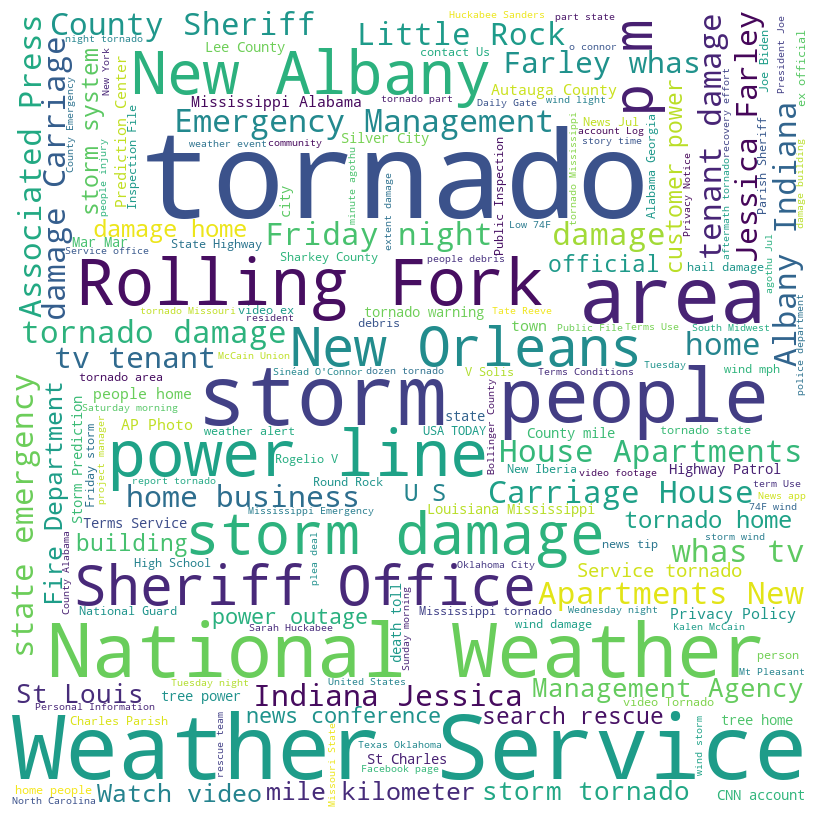

Cluster 3.0


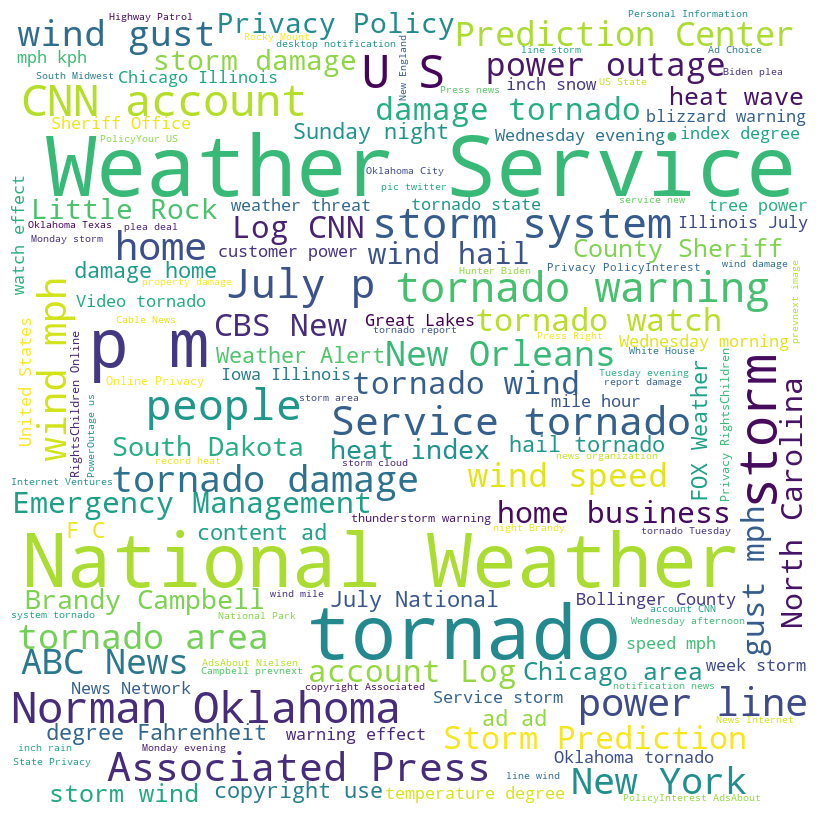

Cluster 5.0


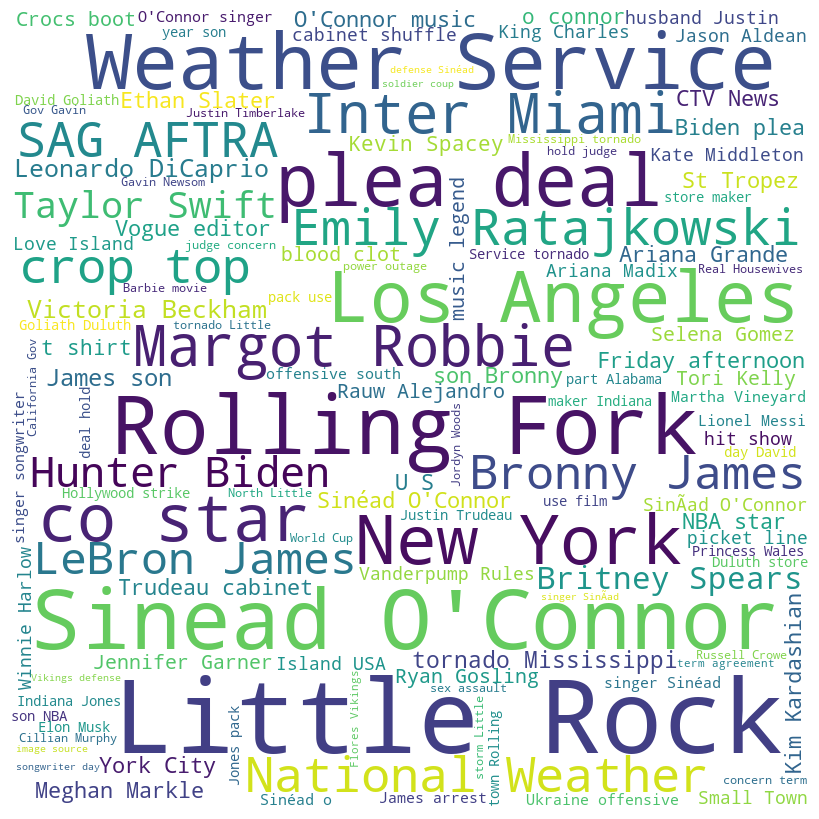

Cluster 7.0


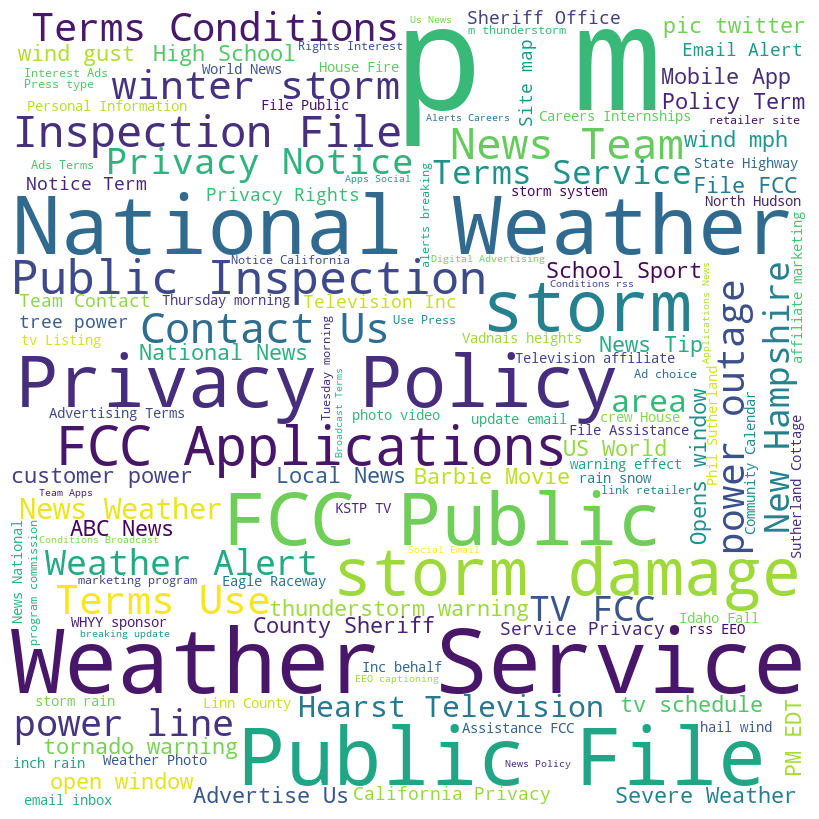

Cluster 6.0


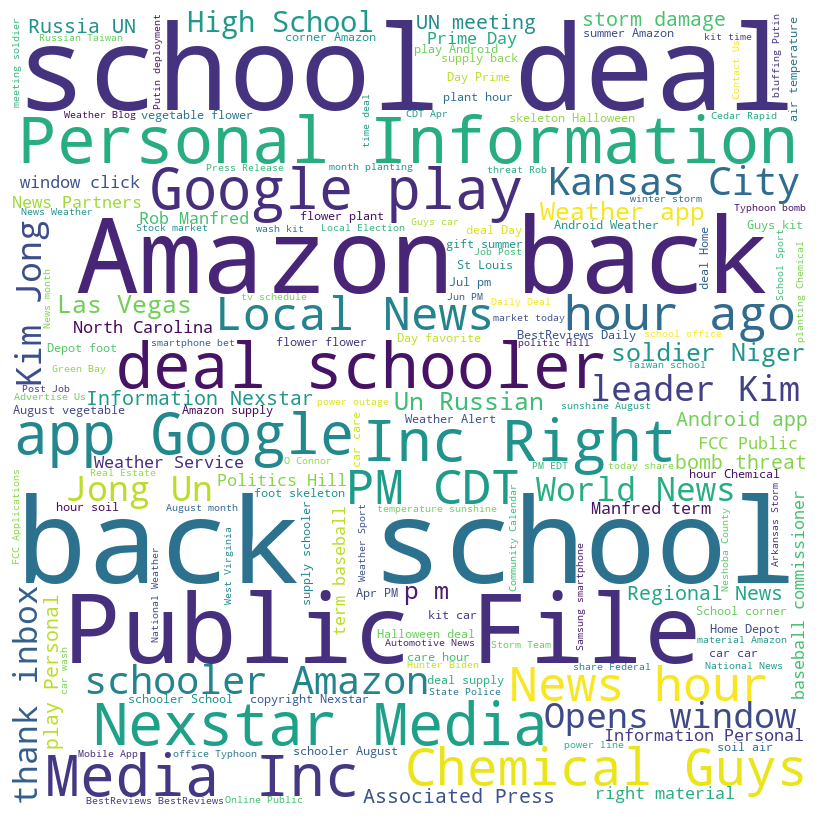

Cluster 15.0


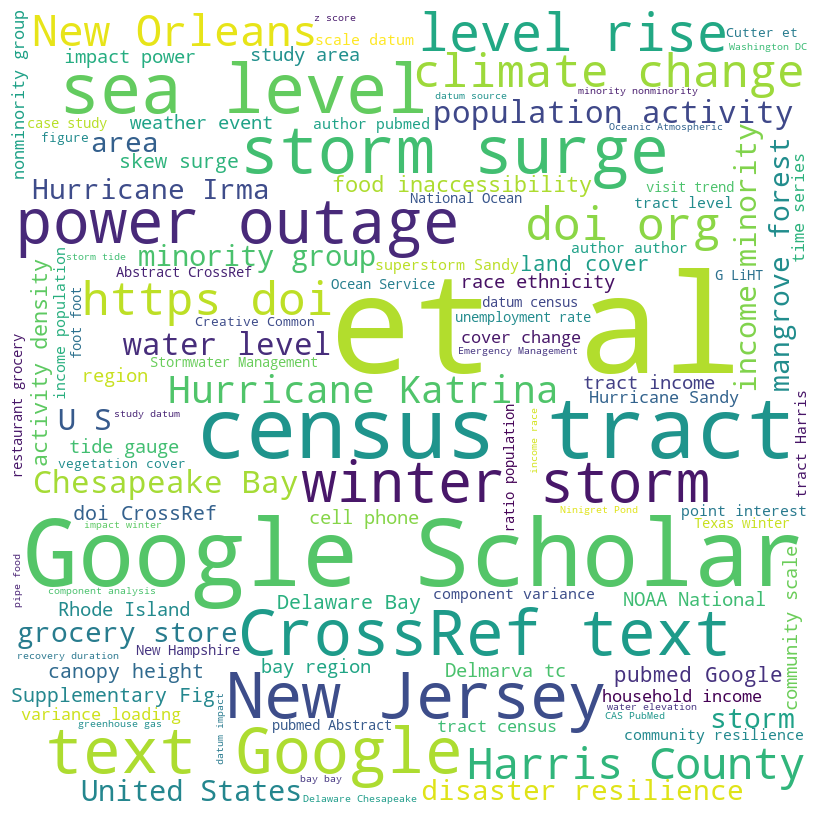

Cluster 20.0


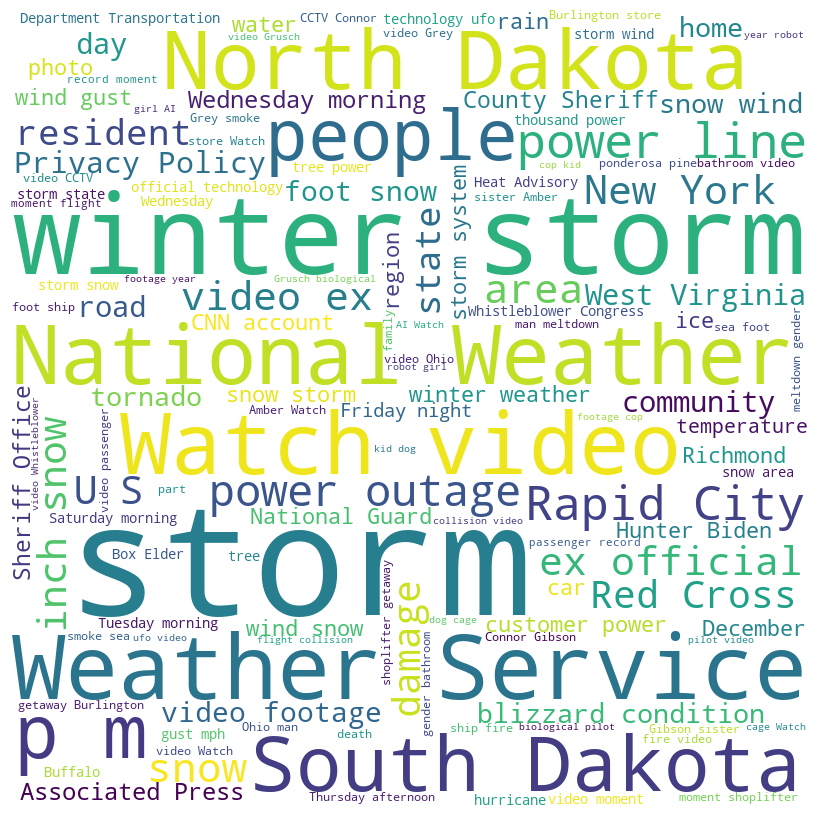

Cluster 12.0


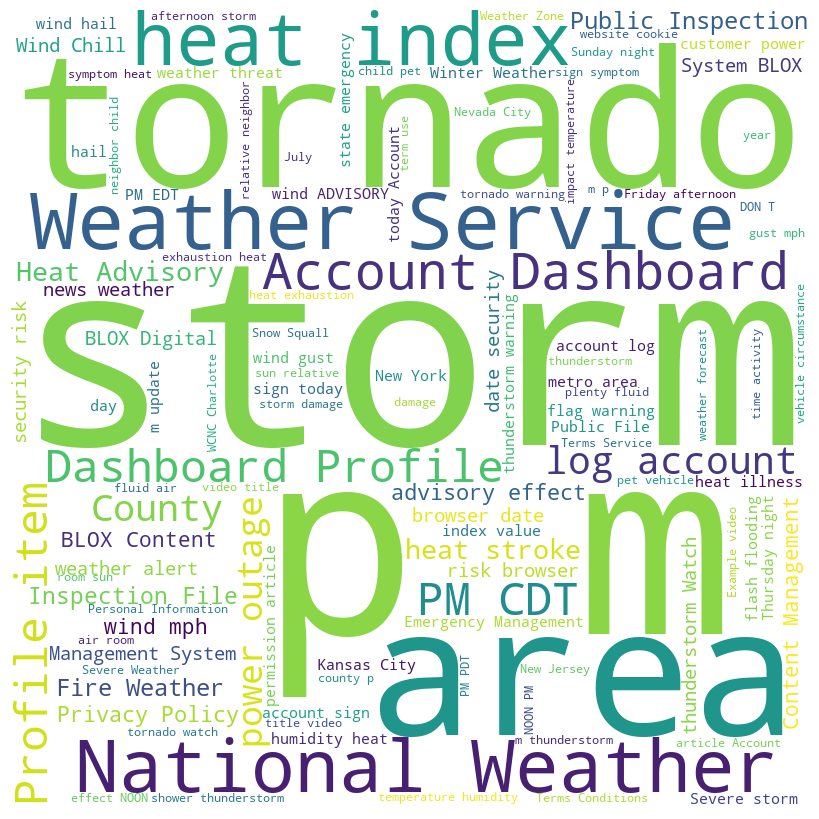

Cluster 0.0


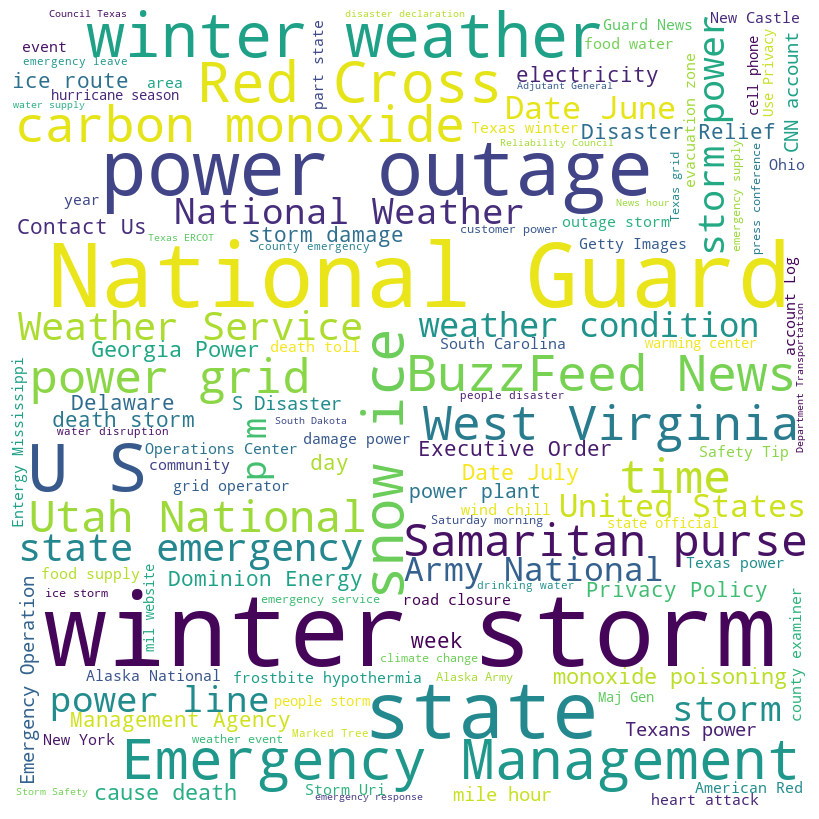

Cluster 9.0


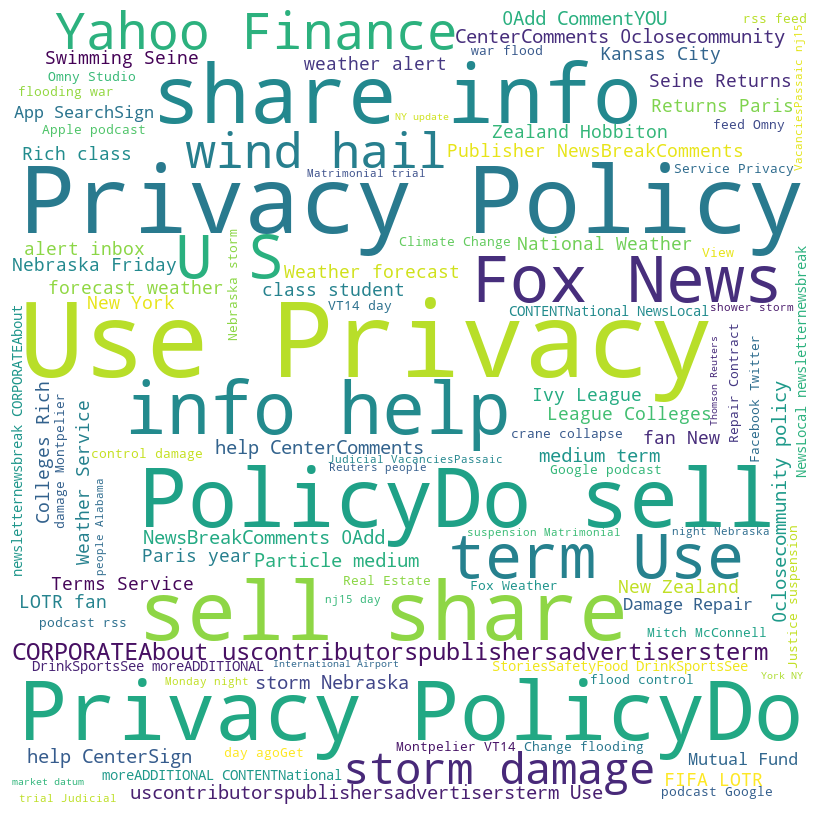

Cluster 10.0


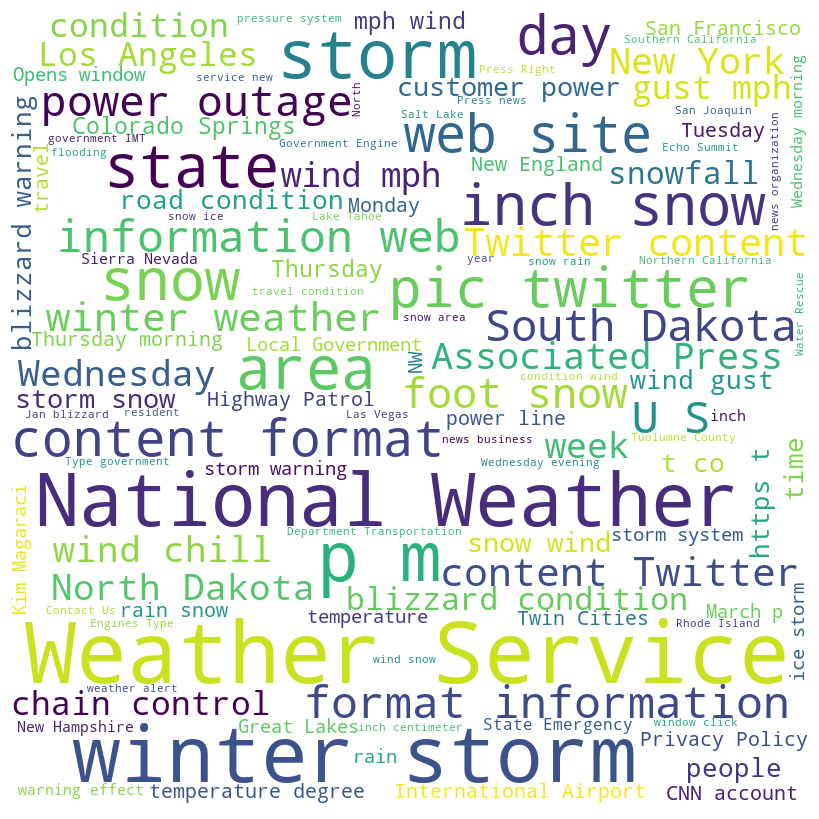

Cluster 1.0


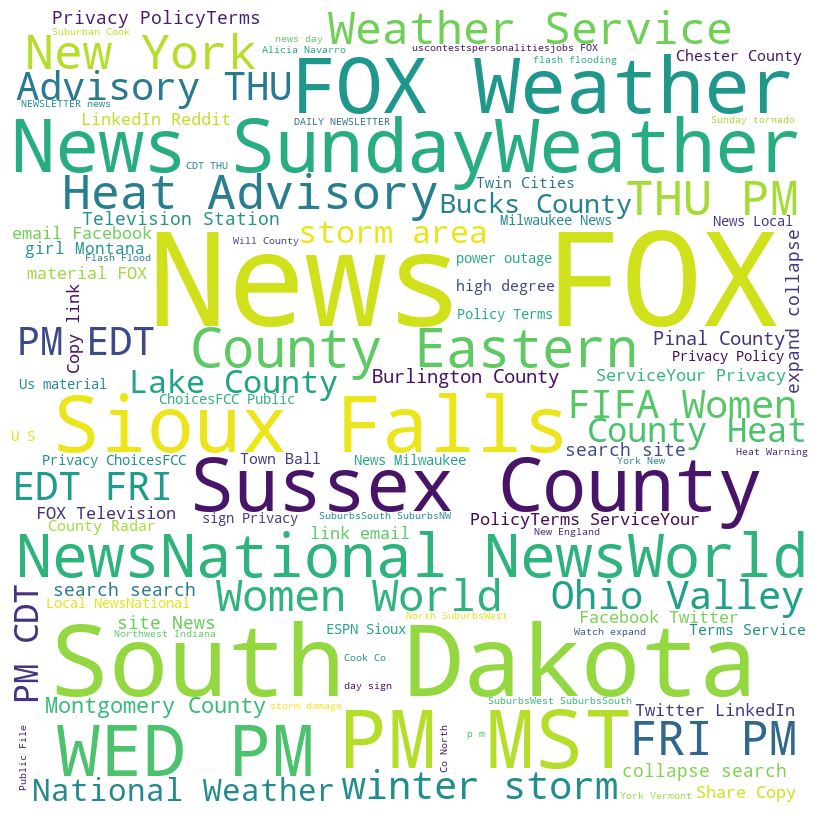

Cluster 4.0


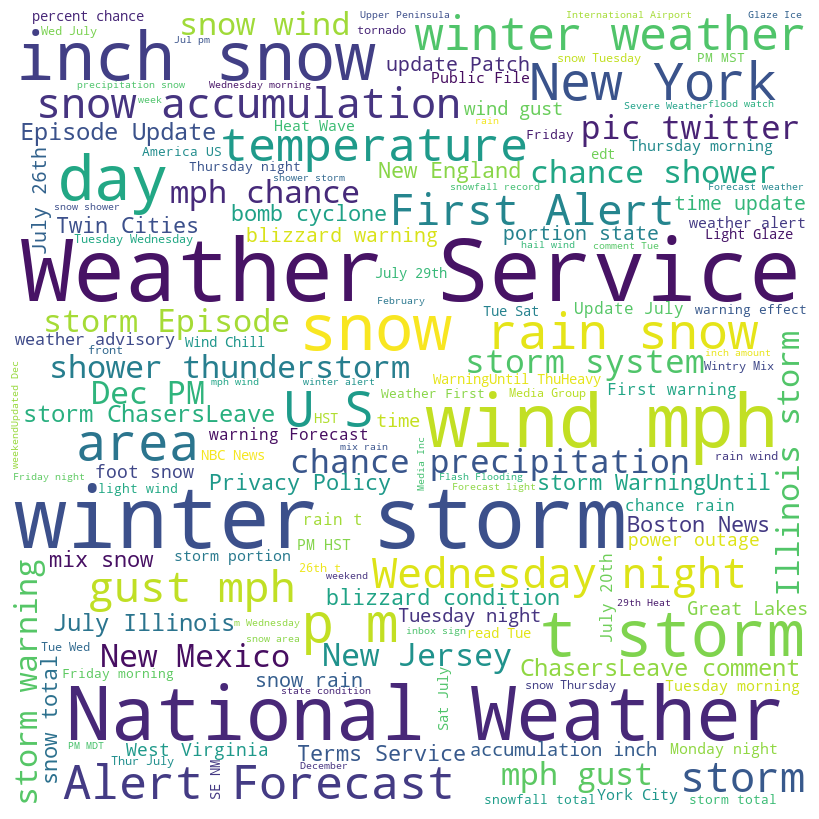

Cluster 8.0


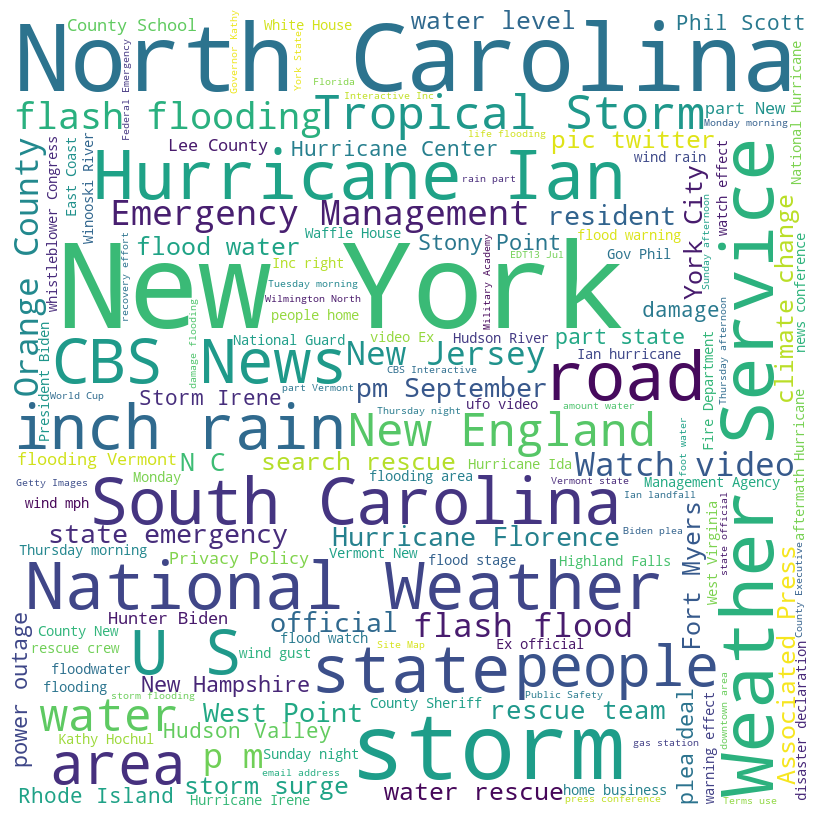

Cluster 16.0


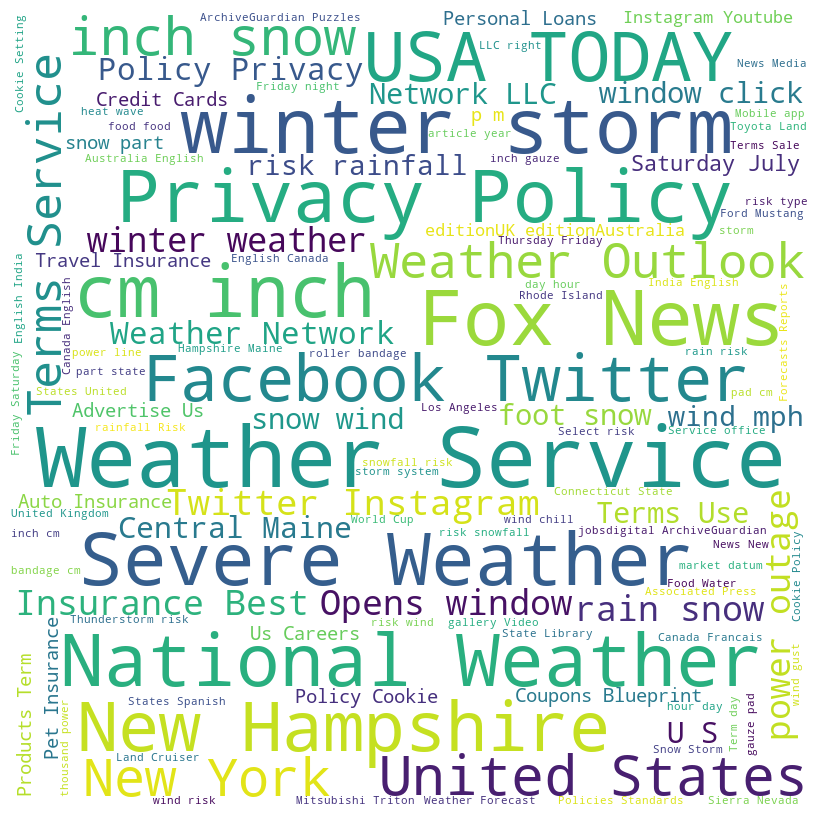

Cluster 14.0


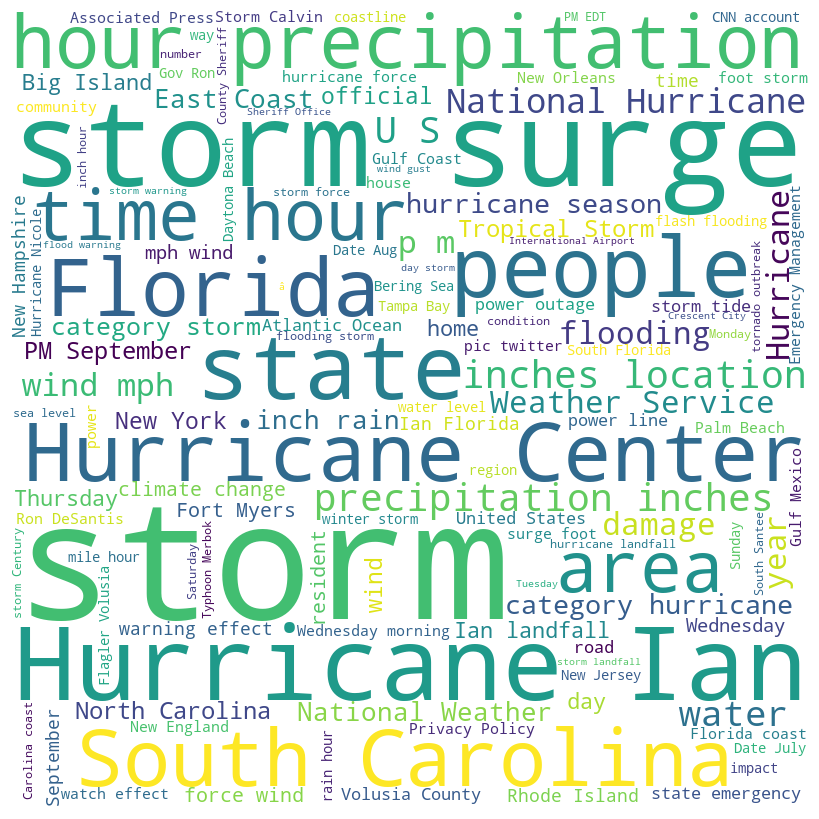

Cluster 17.0


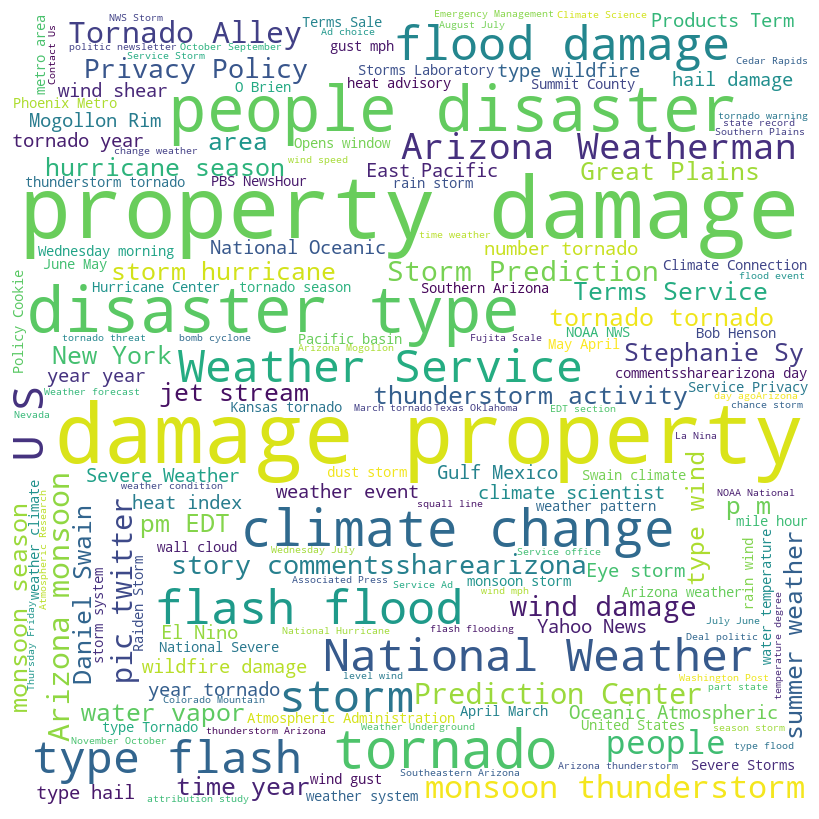

Cluster 13.0


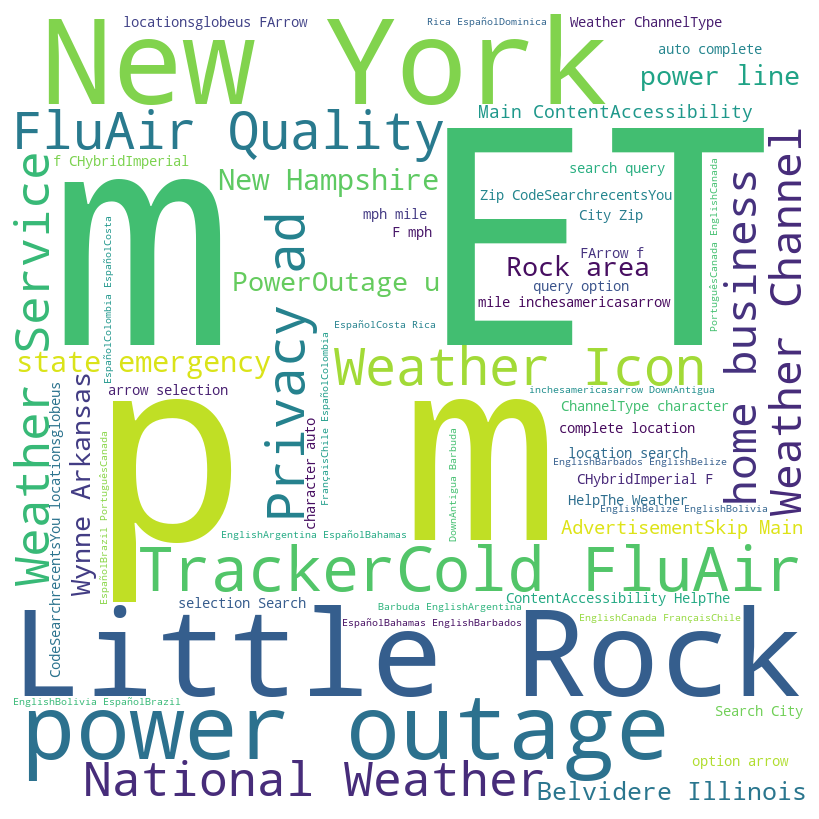

Cluster 2.0


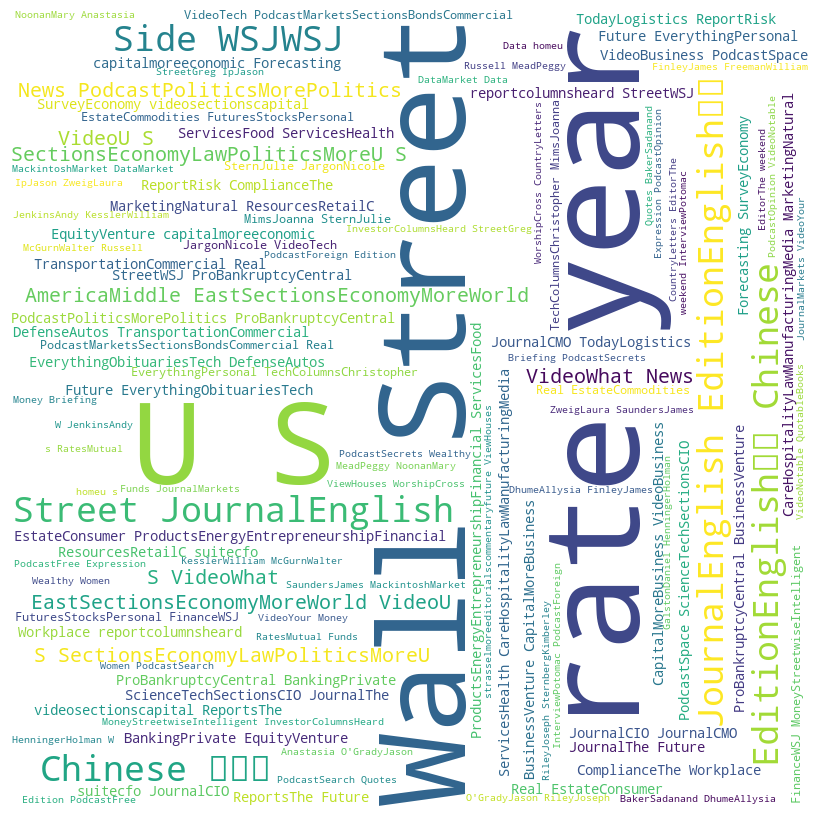

Cluster 23.0


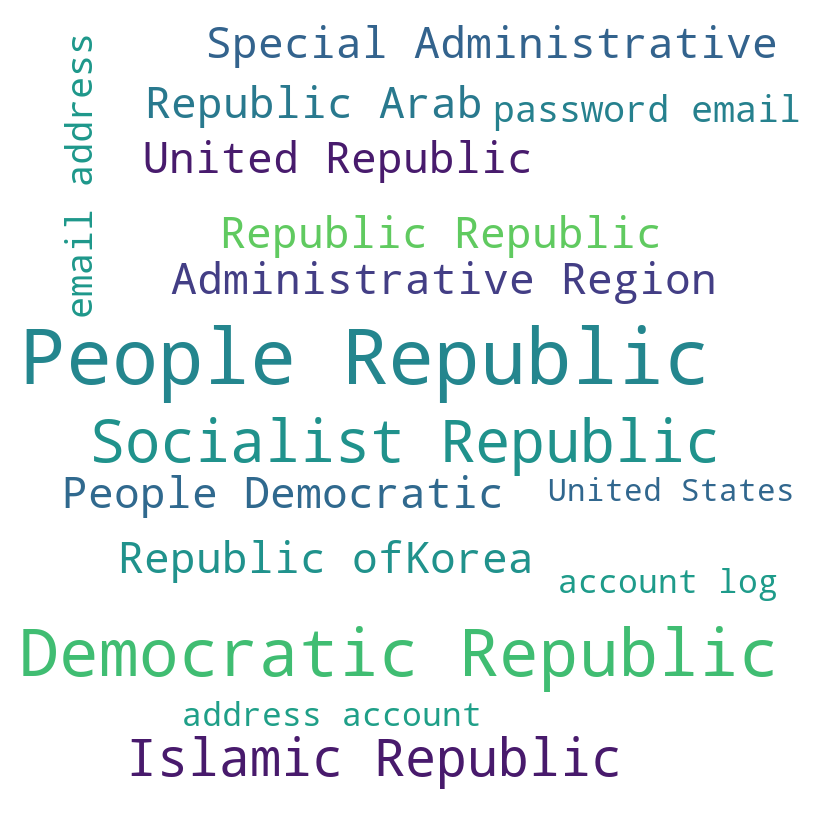

Cluster 24.0


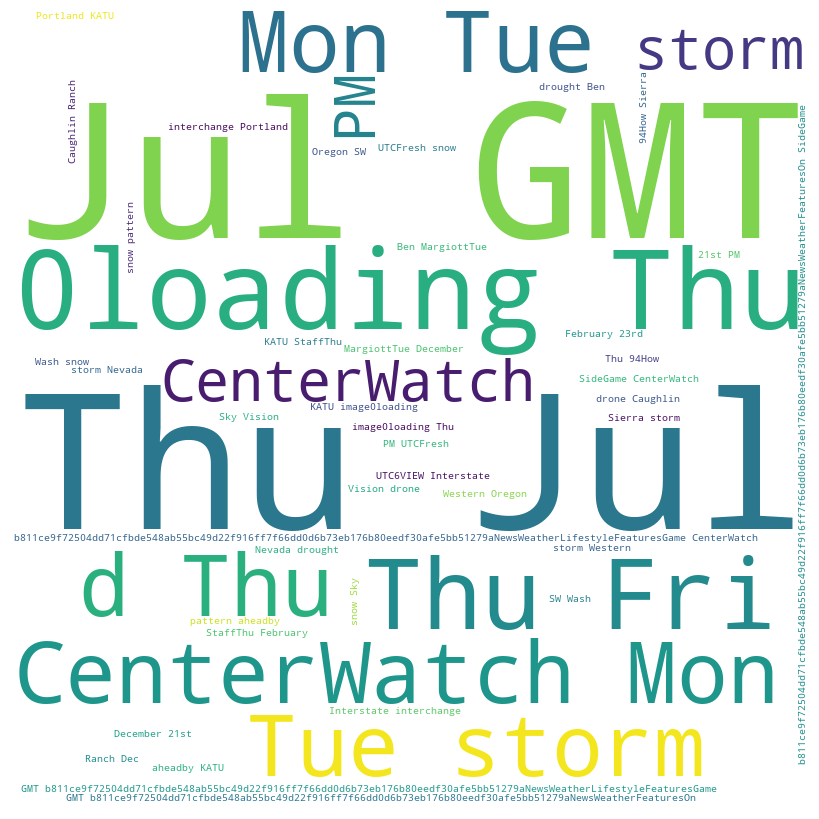

Cluster 11.0


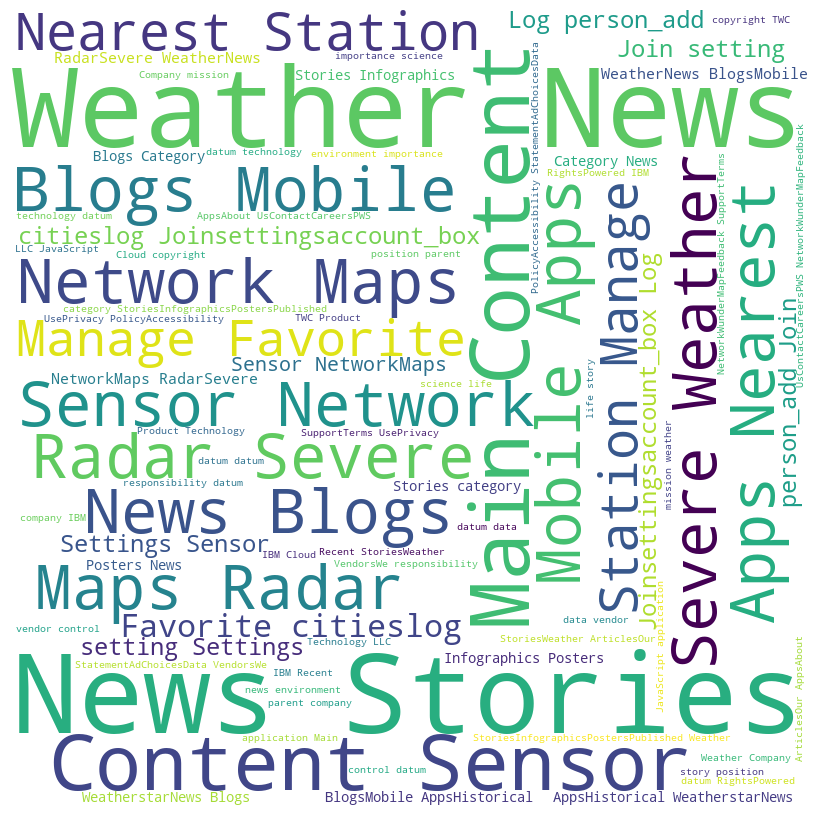

Cluster 21.0


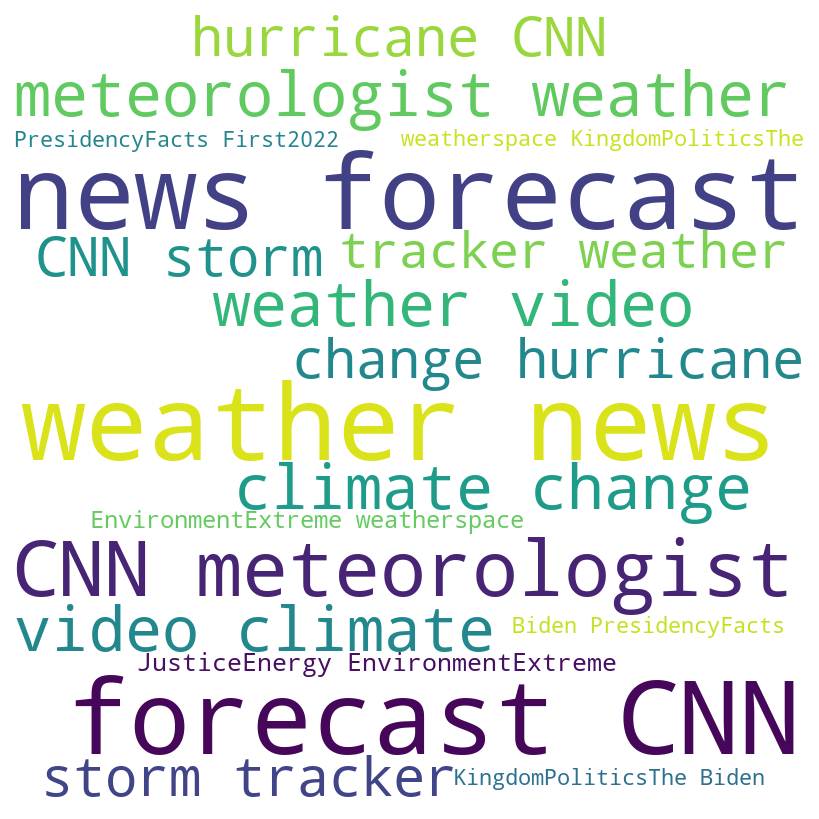

Cluster 18.0


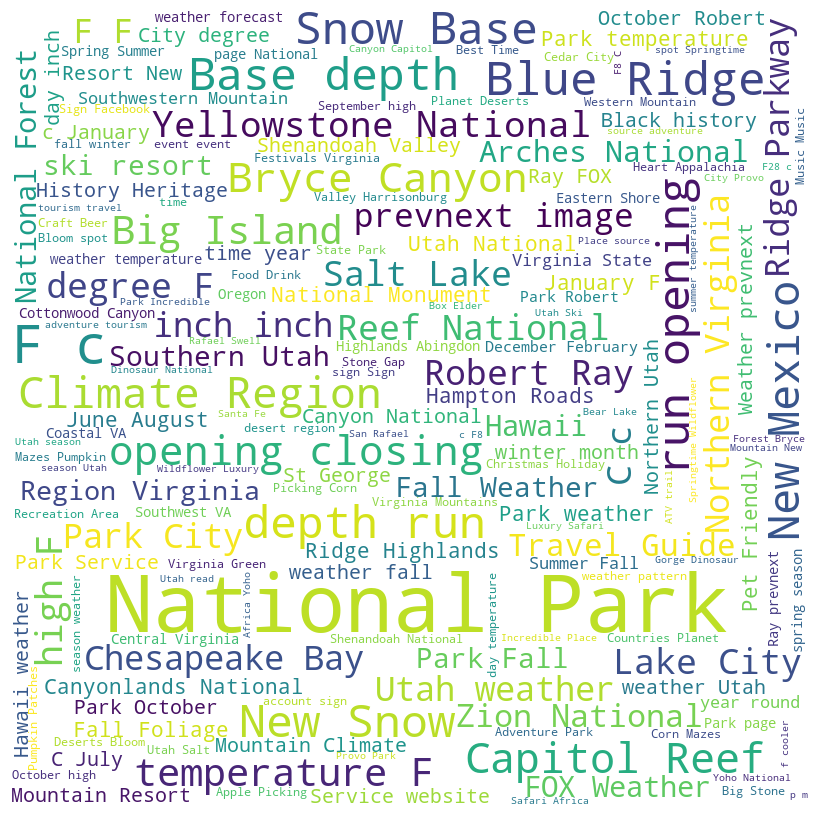

Cluster 22.0


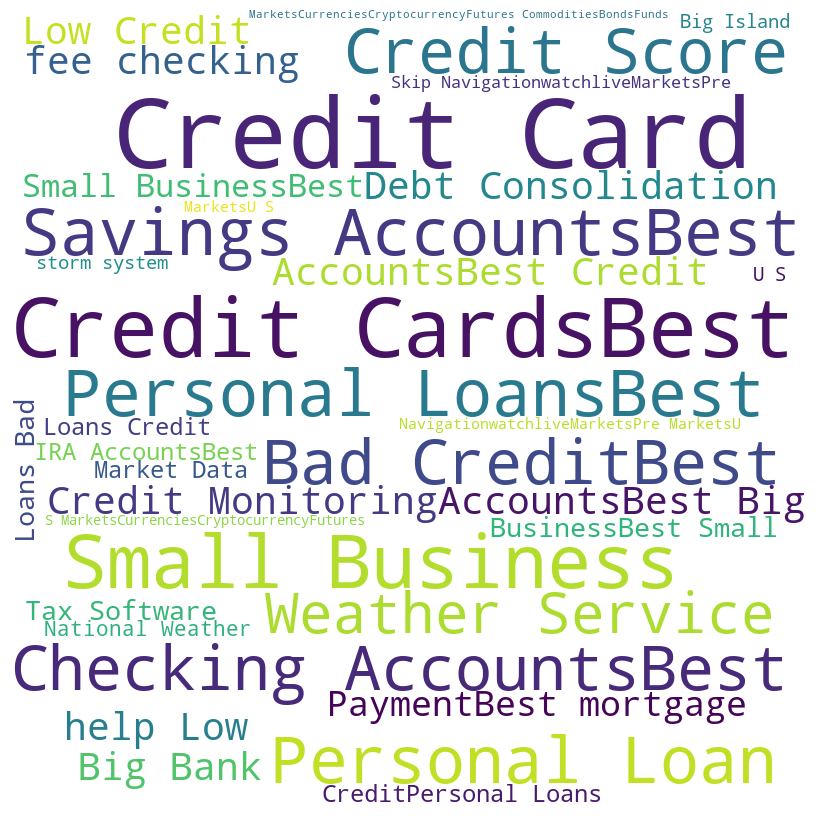

In [55]:
# creating a word cloud of the nouns for each cluster

# importing libraries
import wordcloud as wc
import matplotlib.pyplot as plt
# creating a word cloud for each cluster
for i in clusters:
    print('Cluster', i)
    current_nouns = []
    for j in clusters[i]['nouns']:
        current_nouns.append(j)
    # creating a word cloud
    current_nouns = ' '.join(current_nouns)
    wordcloud = wc.WordCloud(width = 800, height = 800,
                    background_color ='white',
                    min_font_size = 10).generate(current_nouns)
    # plotting the word cloud
    plt.figure(figsize = (8, 8), facecolor = None)
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.tight_layout(pad = 0)
    plt.show()

    # saving the word cloud as a png file in 'word_clouds' folder
    os.makedirs('word_clouds', exist_ok=True)
    wordcloud.to_file('word_clouds/cluster_' + str(i) + '.png')


# END OF PART TWO